# DBSCAN
> with Sklearn
HI
>> LA (Feb)

>> 14 Feb


In [60]:
from math import radians, cos, sin, asin, sqrt
import time
from scipy.spatial.distance import pdist, squareform
from sklearn.cluster import DBSCAN
from geopy.distance import great_circle
from shapely.geometry import MultiPoint
import joblib
import datetime as dt
import random
from tqdm import tqdm
import datetime

In [2]:
import folium

In [3]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

In [4]:
def haversine(lon1, lat1, lon2, lat2):
    """
    Calculate the great circle distance in kilometers between two points 
    on the earth (specified in decimal degrees)
    """
    # convert decimal degrees to radians 
    lon1, lat1, lon2, lat2 = map(radians, [lon1, lat1, lon2, lat2])

    # haversine formula 
    dlon = lon2 - lon1 
    dlat = lat2 - lat1 
    a = sin(dlat/2)**2 + cos(lat1) * cos(lat2) * sin(dlon/2)**2
    c = 2 * asin(sqrt(a)) 
    r = 6371.0088 # Radius of earth in kilometers. Use 3956 for miles. Determines return value units.
    return c * r

In [10]:
forders= os.listdir('./Data/LA/')
station_raw = pd.DataFrame()
for files in forders:
    print(files)
    df= pd.read_csv('./Data/LA/'+files,encoding='utf-8')
    station_raw = pd.concat([station_raw, df])

LA_JUMP_Biketrip_2020-01(4hour_0).csv
LA_JUMP_Biketrip_2020-02(4hour_0).csv
LA_JUMP_Biketrip_2019-12(4hour_0).csv


In [11]:
station_raw=station_raw[station_raw.start_lat>33]
station_raw=station_raw[station_raw.end_lat>33]
station_raw=station_raw[station_raw.end_lat<34.5]
station_raw=station_raw[station_raw.start_lat<34.5]
station_raw=station_raw[station_raw.end_lon>-119]
station_raw=station_raw[station_raw.end_lon>-119]

station_raw=station_raw[station_raw.end_lon<-115]
station_raw=station_raw[station_raw.start_lon<-115]
station_raw = station_raw[station_raw.start_lon!=station_raw.end_lon]
station_raw = station_raw[station_raw.start_lon!=station_raw.end_lon]
station_raw = station_raw[station_raw.start_lat!=station_raw.end_lat]



station_raw

,Unnamed: 0,bike_id,start_time,start_lat,start_lon,start_soc,end_time,end_lat,end_lon,end_soc,duration_second,start_e_level,end_e_level,battery_cosmp
0,0,00475013-f139-40d1-8be7-e4f41e008ed4,2020-01-01 00:01:08,34.007213,-118.492552,72%,2020-01-01 00:02:08,34.007197,-118.492550,72%,60.0,72,72,0
1,1,00475013-f139-40d1-8be7-e4f41e008ed4,2020-01-01 00:11:08,34.007197,-118.492550,72%,2020-01-01 00:12:09,34.007207,-118.492552,72%,61.0,72,72,0
2,2,00475013-f139-40d1-8be7-e4f41e008ed4,2020-01-01 00:21:08,34.007207,-118.492552,72%,2020-01-01 00:22:07,34.007215,-118.492555,72%,59.0,72,72,0
5,5,00475013-f139-40d1-8be7-e4f41e008ed4,2020-01-01 00:51:07,34.007182,-118.492555,72%,2020-01-01 00:52:07,34.007102,-118.492517,72%,60.0,72,72,0
6,6,00475013-f139-40d1-8be7-e4f41e008ed4,2020-01-01 01:01:07,34.007102,-118.492517,72%,2020-01-01 01:02:07,34.007062,-118.492447,72%,60.0,72,72,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4792688,4822122,80732c2b-8166-4996-9677-99bc63a8a1fe,2019-12-30 08:11:07,34.019690,-118.497472,29%,2019-12-30 08:12:07,34.019697,-118.497480,29%,60.0,29,29,0
4792689,4822123,80732c2b-8166-4996-9677-99bc63a8a1fe,2019-12-30 08:21:08,34.019697,-118.497480,29%,2019-12-30 08:22:07,34.019573,-118.497420,29%,59.0,29,29,0
4792690,4822124,80732c2b-8166-4996-9677-99bc63a8a1fe,2019-12-30 08:31:08,34.019573,-118.497420,29%,2019-12-30 08:32:08,34.019458,-118.497422,29%,60.0,29,29,0
4792692,4822126,80732c2b-8166-4996-9677-99bc63a8a1fe,2019-12-30 08:49:07,34.019537,-118.497422,29%,2019-12-30 08:50:07,34.019507,-118.497485,29%,60.0,29,29,0


In [ ]:
#k=[]
#for i in range(0,301740):
#    k.append(time.strftime('%Y-%m-%d %H:%M:%S', time.localtime(station_raw.iloc[i]['time_stamp_ori']))) 

In [ ]:
#station_raw['time_stamp_ori']=k

In [ ]:
#station_raw

In [ ]:
'''
df = station_raw
df['start_time'] = pd.to_datetime(df['start_time'])
query_month = 2
query_day = 10
df = df.query('start_time.dt.month == @query_month')
df = df.query('start_time.dt.day == @query_day')
df.reset_index(drop=True, inplace=True)

maxlen =df.shape[0]

df
'''


,Unnamed: 0,bike_id,start_time,start_lat,start_lon,start_soc,end_time,end_lat,end_lon,end_soc,duration_second,start_e_level,end_e_level,battery_cosmp
0,915,007faba4-d2b7-4b29-ac09-fae4b7a06214,2020-02-10 00:03:00,34.020778,-118.502140,88%,2020-02-10 00:04:00,34.020788,-118.502148,88%,60.0,88,88,0
1,916,007faba4-d2b7-4b29-ac09-fae4b7a06214,2020-02-10 00:31:00,34.020788,-118.502148,88%,2020-02-10 00:32:00,34.020758,-118.502222,88%,60.0,88,88,0
2,917,007faba4-d2b7-4b29-ac09-fae4b7a06214,2020-02-10 00:33:00,34.020758,-118.502222,88%,2020-02-10 00:34:00,34.020798,-118.502162,88%,60.0,88,88,0
3,918,007faba4-d2b7-4b29-ac09-fae4b7a06214,2020-02-10 00:43:00,34.020798,-118.502162,88%,2020-02-10 00:44:00,34.020827,-118.502212,88%,60.0,88,88,0
4,919,007faba4-d2b7-4b29-ac09-fae4b7a06214,2020-02-10 00:53:00,34.020827,-118.502212,88%,2020-02-10 00:54:00,34.020758,-118.502223,88%,60.0,88,88,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
66000,1047832,b9d9763f-2acf-4d3c-882b-0978864d201a,2020-02-10 21:30:00,33.994647,-118.480525,57%,2020-02-10 21:31:00,33.994637,-118.480537,57%,60.0,57,57,0
66001,1047833,b9d9763f-2acf-4d3c-882b-0978864d201a,2020-02-10 21:40:00,33.994637,-118.480537,57%,2020-02-10 21:41:00,33.994643,-118.480527,57%,60.0,57,57,0
66002,1047834,b9d9763f-2acf-4d3c-882b-0978864d201a,2020-02-10 21:50:00,33.994643,-118.480527,57%,2020-02-10 21:51:00,33.994617,-118.480568,57%,60.0,57,57,0
66003,1047835,b9d9763f-2acf-4d3c-882b-0978864d201a,2020-02-10 22:00:00,33.994617,-118.480568,57%,2020-02-10 22:01:00,33.994485,-118.480490,57%,60.0,57,57,0


In [12]:
df.columns

Index(['Unnamed: 0', 'bike_id', 'start_time', 'start_lat', 'start_lon',
       'start_soc', 'end_time', 'end_lat', 'end_lon', 'end_soc',
       'duration_second', 'start_e_level', 'end_e_level', 'battery_cosmp'],
      dtype='object')

In [13]:
df1=df.drop( [ 'Unnamed: 0', 'bike_id', 'start_time', 
       'start_soc', 'end_time', 'end_lat', 'end_lon', 'end_soc',
       'duration_second', 'start_e_level', 'end_e_level', 'battery_cosmp'],axis=1)
df1 = df1.reindex(columns=['start_lat', 'start_lon'])
df1 = df1.rename(columns={'start_lat':'lat','start_lon':'lon'})
df1.reset_index(drop=True, inplace=True)
df1=df1[['lat','lon']]
df1=df1[df1.lat>30]

df1

,lat,lon
0,34.023358,-118.496198
1,34.023360,-118.496195
2,34.023380,-118.496188
3,34.023372,-118.496183
4,34.023388,-118.496168
...,...,...
4792689,34.019697,-118.497480
4792690,34.019573,-118.497420
4792691,34.019458,-118.497422
4792692,34.019537,-118.497422


In [14]:
df2=df.drop( [ 'Unnamed: 0', 'bike_id', 'start_time', 'start_lat', 'start_lon',
       'start_soc', 'end_time', 'end_soc',
       'duration_second', 'start_e_level', 'end_e_level', 'battery_cosmp'],axis=1)
df2 = df2.reindex(columns=['end_lat', 'end_lon'])
df2 = df2.rename(columns={'end_lat':'lat','end_lon':'lon'})
df2.reset_index(drop=True, inplace=True)
df2=df2[['lat','lon']]
df2=df2[df2.lat>30]

df2


,lat,lon
0,34.023360,-118.496195
1,34.023383,-118.496190
2,34.023372,-118.496183
3,34.023388,-118.496168
4,34.023393,-118.496213
...,...,...
4792689,34.019573,-118.497420
4792690,34.019458,-118.497422
4792691,34.019537,-118.497422
4792692,34.019507,-118.497485


In [23]:
len(df1)

4792662

In [25]:
tqdm

<module 'tqdm' from '/Users/issa/opt/anaconda3/envs/network/lib/python3.9/site-packages/tqdm/__init__.py'>

In [61]:
distances = []
for i in tqdm(range(0,int(len(df1)))):
    t1 = df1.iloc[i]
    t2 = df2.iloc[i]
    k= haversine(t1[0],t1[1],t2[0],t2[1])*1000
    if k>40:
        distances.append(k)


  1%|          | 50379/4792662 [00:02<04:11, 18838.32it/s]


KeyboardInterrupt: 

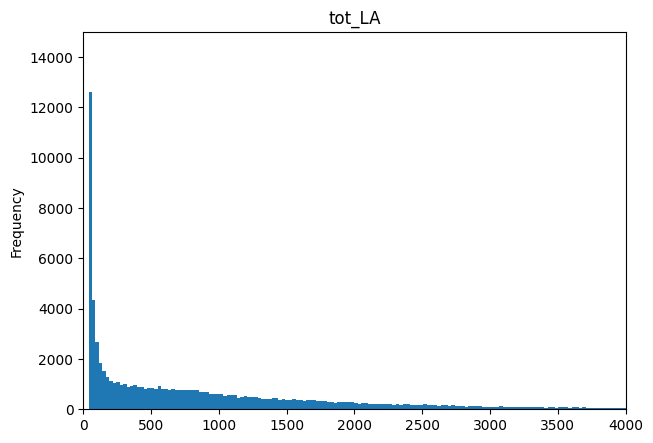

In [50]:
plt.rcParams.update({'figure.figsize':(7,5), 'figure.dpi':100})
plt.xlim(0,4000)
plt.ylim(0,15000)
# Plot Histogram on x
plt.hist(distances,bins=500000)
plt.gca().set(title='tot_LA', ylabel='Frequency')

In [ ]:
df.columns

Index(['Unnamed: 0', 'bike_id', 'start_time', 'start_lat', 'start_lon',
       'start_soc', 'end_time', 'end_lat', 'end_lon', 'end_soc',
       'duration_second', 'start_e_level', 'end_e_level', 'battery_cosmp'],
      dtype='object')

In [51]:
df_t = df.drop(['Unnamed: 0', 'bike_id',  'start_lat', 'start_lon',
       'start_soc', 'end_time', 'end_lat', 'end_lon', 'end_soc',
       'duration_second', 'start_e_level', 'end_e_level', 'battery_cosmp'],axis=1)
df_t

,start_time
0,2019-12-01 00:06:04
1,2019-12-01 00:16:05
2,2019-12-01 00:36:04
3,2019-12-01 00:46:04
4,2019-12-01 00:56:04
...,...
4792689,2019-12-30 08:21:08
4792690,2019-12-30 08:31:08
4792691,2019-12-30 08:41:07
4792692,2019-12-30 08:49:07


In [63]:
dist_of_time = np.zeros(24)
for i in tqdm(range(0,len(df1))):
    t1 = df_t.iloc[i]
    format = '%Y-%m-%d %H:%M:%S'
    dt_datetime = datetime.datetime.strptime(t1[0],format)

    dist_of_time[dt_datetime.hour] +=1

100%|██████████| 4792662/4792662 [02:47<00:00, 28628.37it/s]


In [64]:
dist_of_time

array([200901., 201514., 202633., 203727., 204142., 203727., 204991.,
       205538., 205714., 204729., 203276., 201976., 201316., 198597.,
       194545., 187723., 192162., 195821., 196420., 195278., 193788.,
       194686., 199563., 199895.])

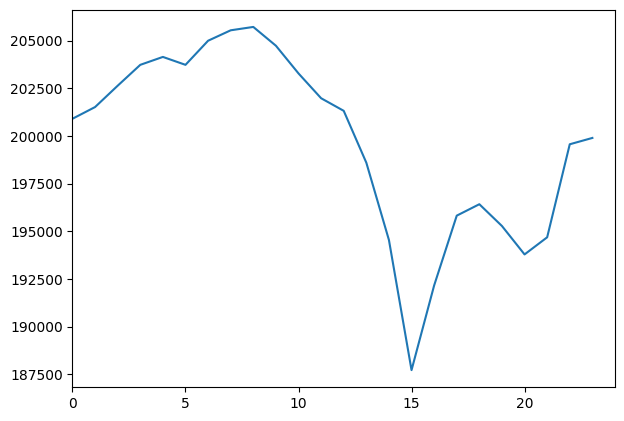

In [65]:
plt.rcParams.update({'figure.figsize':(7,5), 'figure.dpi':100})
plt.xlim(0,24)
plt.plot(dist_of_time)

# DBSCAN

In [ ]:
City_Name = 'LA'

In [ ]:
kms_per_radian = 6371.0088
epsilon = 0.001/kms_per_radian
min_sample = 3
print("radian of earth is ", kms_per_radian, " eps is ", epsilon, " min_samples are ", min_sample )

radian of earth is  6371.0088  eps is  1.5696101377226164e-07  min_samples are  3


In [ ]:
coords = df1.to_numpy()
#db = joblib.load('./testDB.joblib')
db = DBSCAN(eps = epsilon , min_samples = min_sample , algorithm='ball_tree', metric='haversine').fit(np.radians(coords))

In [ ]:
start_time = time.time()
cluster_labels = db.labels_


# get the number of clusters
num_clusters = len(set(cluster_labels))

# all done, print the outcome
message = 'Clustered {:,} points down to {:,} clusters, for {:.1f}% compression in {:,.2f} seconds'
print(message.format(len(df), num_clusters, 100*(1 - float(num_clusters) / len(df)), time.time()-start_time))
clusters = pd.Series([coords[cluster_labels==n] for n in range(num_clusters)])


Clustered 66,005 points down to 3,321 clusters, for 95.0% compression in 0.01 seconds


In [ ]:
def get_centermost_point(cluster):
    centroid = (MultiPoint(cluster).centroid.x, MultiPoint(cluster).centroid.y)
    centermost_point = min(cluster, key=lambda point: great_circle(point, centroid).m)

    return tuple(centermost_point)


In [ ]:
centermost_points = []
for cluster in clusters.iteritems():
    if len(cluster[1]) >= min_sample:
        centermost_points.append(get_centermost_point(cluster[1]))


In [ ]:
lats, lons = zip(*centermost_points)
rep_points = pd.DataFrame({'lon':lons, 'lat':lats})


In [ ]:
rs = rep_points.apply(lambda row: df1[(df1['lat']==row['lat']) & (df1['lon']==row['lon'])].iloc[0], axis=1)
rs.head(5)

,lat,lon
0,34.020788,-118.502148
1,34.020793,-118.502202
2,34.020803,-118.502110
3,34.020790,-118.502163
4,33.994628,-118.476227


In [ ]:
df_cluster = pd.DataFrame(clusters, columns=['position'])
print(df_cluster.shape)
df_cluster.head(10)


(3321, 1)


,position
0,"[[34.02077833, -118.50214], [34.02078833, -118..."
1,"[[34.02078167, -118.50221], [34.02078833, -118..."
2,"[[34.02081167, -118.5021033], [34.02080833, -1..."
3,"[[34.02079833, -118.5021617], [34.02078667, -1..."
4,"[[33.99463167, -118.4762167], [33.99462167, -1..."
5,"[[33.99462667, -118.4761967], [33.99461833, -1..."
6,"[[34.00851167, -118.4952417], [34.008495, -118..."
7,"[[34.00852167, -118.4952367], [34.00851667, -1..."
8,"[[34.0085, -118.49529], [34.00850333, -118.495..."
9,"[[34.00853, -118.49528], [34.00851667, -118.49..."


In [ ]:
temp = df_cluster.iloc[1]
temp[0].shape

(10, 2)

# Shanghai

In [ ]:
# 위도
latitude =  33.852235
# 경도
longitude = -118.243683

In [ ]:
number_of_colors = num_clusters

colors = ["#"+''.join([random.choice('0123456789ABCDEF') for j in range(6)])
             for i in range(number_of_colors)]


In [ ]:
m = folium.Map(location=[latitude, longitude],
               zoom_start=10, 
               width=1300, 
               height=1000
              )
m

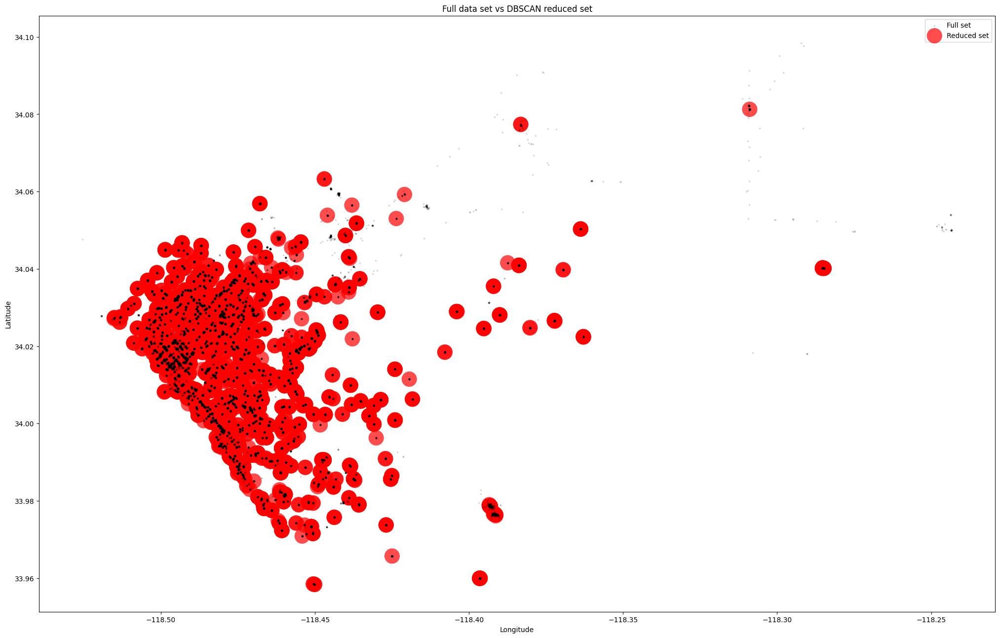

In [ ]:
fig, ax = plt.subplots(figsize=[25, 16])
rs_scatter = ax.scatter(rs['lon'], rs['lat'], c='red', edgecolor='None', alpha=0.7, s=500)
df_scatter = ax.scatter(df1['lon'], df1['lat'], c='k', alpha=0.1, s=3)
ax.set_title('Full data set vs DBSCAN reduced set')
ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')
ax.legend([df_scatter, rs_scatter], ['Full set', 'Reduced set'], loc='upper right')
plt.show()

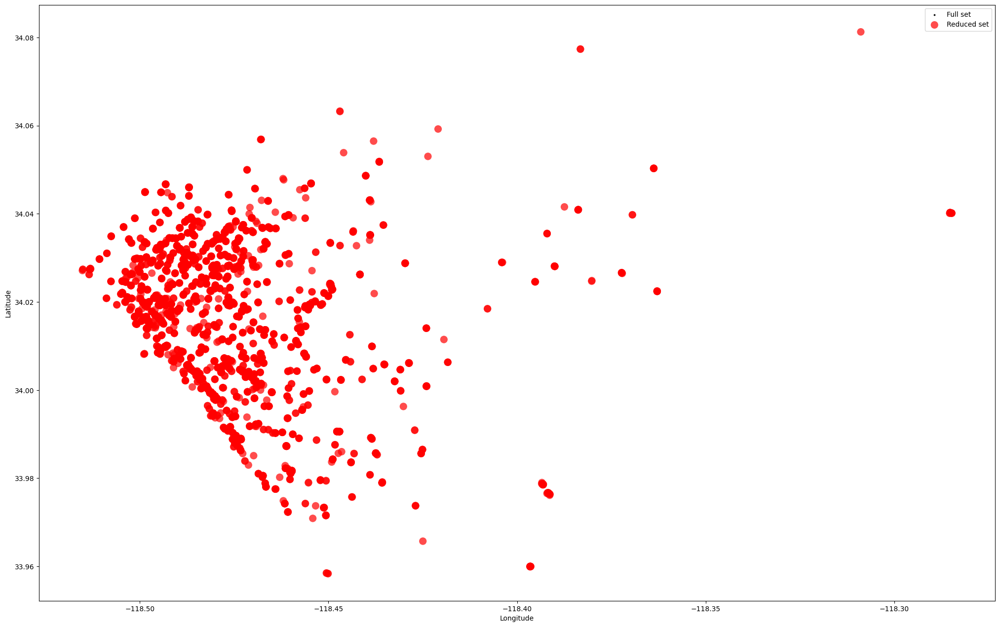

In [ ]:
fig, ax = plt.subplots(figsize=[25,16])
rs_scatter = ax.scatter(rs['lon'],rs['lat'], c = 'red', edgecolor = 'None', alpha = 0.7,s=120)
ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')
ax.legend([df_scatter, rs_scatter], ['Full set', 'Reduced set'], loc='upper right')
plt.show()

In [ ]:
#m.save('./Maps/'+str(City_Name)+'/DBSCAN_Heat_V2_DC_'+str(epsilon * kms_per_radian)+'.html')


In [ ]:
from joblib import dump, load

#dump(db, 'testDB.joblib')


## To_Do List 
### plot dendrogram

check its volume & hierarchy

> 28 March. failed


In [ ]:
cl = pd.DataFrame(cluster_labels)
np.mean(cl.value_counts().to_numpy())

19.874736525143028

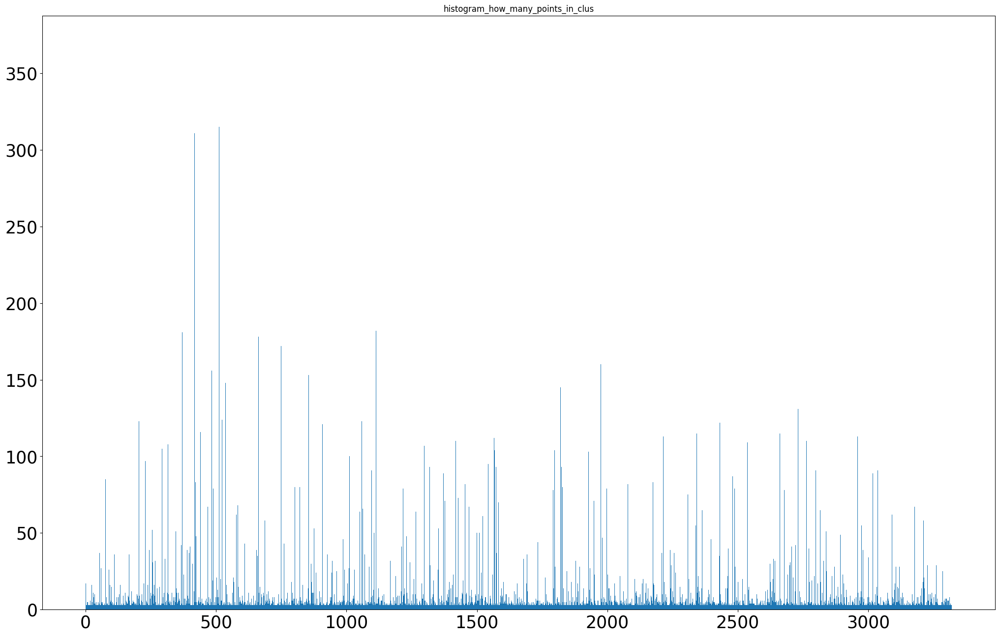

In [ ]:
plt.figure(figsize=(25,16))
plt.hist(cluster_labels, bins = np.linspace(0,num_clusters,num_clusters)) 
plt.title("histogram_how_many_points_in_clus") 
plt.xticks(fontsize=25)
plt.yticks(fontsize=25)
plt.savefig('./Maps/'+City_Name+'/hist_of_clus_of_'+City_Name+'_'+str(epsilon* kms_per_radian)+'.png')
plt.show()

In [ ]:
num_clusters

3321

In [ ]:
solution = 0

In [ ]:
for j in range(0, num_clusters):
    solution += list(cluster_labels).count(j)
solution

38310

In [ ]:
avg_clus = solution/num_clusters
print(avg_clus)

11.5356820234869


# Build a Network

> with Networkx


In [ ]:
import networkx as nx

In [ ]:
def haversine(lon1, lat1, lon2, lat2):
    """
    Calculate the great circle distance in kilometers between two points 
    on the earth (specified in decimal degrees)
    """
    # convert decimal degrees to radians 
    lon1, lat1, lon2, lat2 = map(radians, [lon1, lat1, lon2, lat2])

    # haversine formula 
    dlon = lon2 - lon1 
    dlat = lat2 - lat1 
    a = sin(dlat/2)**2 + cos(lat1) * cos(lat2) * sin(dlon/2)**2
    c = 2 * asin(sqrt(a)) 
    r = 6371.0088 # Radius of earth in kilometers. Use 3956 for miles. Determines return value units.
    return c * r

In [ ]:
maxlen = len(centermost_points)
print(maxlen)

3320


In [ ]:
solution=[]
print (solution)

[]


In [ ]:
numclus = df.shape[0]
checkmaker = -1
for i in range(0, 10000):
    minv = 3
    for j in range(0,len(centermost_points)):
        t = centermost_points[j]
        m = df2.iloc[i]
        target = haversine(t[0],t[1],m[0],m[1])
        if(target == 0):

            checkmaker = j
            break
        if(target<minv and target >0):
            checkmaker = j
            minv = target
            if(minv<0.5 ):
                checkmaker =j
                break
        if( j == maxlen and minv>0.5 ):
            checkmaker=-1
            break
    if cluster_labels[checkmaker]==-1 or cluster_labels[i] ==-1 or checkmaker == -1:
        print("OPPPPS =  ", i)
        continue
    else:
        if i % 1000 == 0:
            print(i/1000)
        #print("we've got ", i, " these here, bro ", checkmaker, " and i'm " , (cluster_labels[i],cluster_labels[checkmaker]))
        solution.append([cluster_labels[i],cluster_labels[checkmaker]])

0.0
OPPPPS =   2
OPPPPS =   4
OPPPPS =   5
OPPPPS =   12
OPPPPS =   13
OPPPPS =   14
OPPPPS =   15
OPPPPS =   18
OPPPPS =   19
OPPPPS =   20
OPPPPS =   21
OPPPPS =   22
OPPPPS =   23
OPPPPS =   24
OPPPPS =   25
OPPPPS =   26
OPPPPS =   27
OPPPPS =   28
OPPPPS =   29
OPPPPS =   30
OPPPPS =   31
OPPPPS =   32
OPPPPS =   33
OPPPPS =   34
OPPPPS =   35
OPPPPS =   36
OPPPPS =   37
OPPPPS =   38
OPPPPS =   39
OPPPPS =   40
OPPPPS =   41
OPPPPS =   42
OPPPPS =   43
OPPPPS =   44
OPPPPS =   45
OPPPPS =   46
OPPPPS =   47
OPPPPS =   48
OPPPPS =   49
OPPPPS =   50
OPPPPS =   51
OPPPPS =   52
OPPPPS =   53
OPPPPS =   54
OPPPPS =   55
OPPPPS =   56
OPPPPS =   57
OPPPPS =   58
OPPPPS =   59
OPPPPS =   60
OPPPPS =   61
OPPPPS =   62
OPPPPS =   63
OPPPPS =   64
OPPPPS =   65
OPPPPS =   66
OPPPPS =   67
OPPPPS =   68
OPPPPS =   69
OPPPPS =   70
OPPPPS =   71
OPPPPS =   72
OPPPPS =   73
OPPPPS =   74
OPPPPS =   75
OPPPPS =   76
OPPPPS =   77
OPPPPS =   78
OPPPPS =   79
OPPPPS =   80
OPPPPS =   81
OPPPP

In [ ]:
numclus = df.shape[0]
checkmaker = -1
for i in range(10001, 20000):
    minv = 3
    for j in range(0,len(centermost_points)):
        t = centermost_points[j]
        m = df2.iloc[i]
        target = haversine(t[0],t[1],m[0],m[1])
        if(target == 0):

            checkmaker = j
            break
        if(target<minv and target >0):
            checkmaker = j
            minv = target
            if(minv<0.5 ):
                checkmaker =j
                break
        if( j == maxlen and minv>0.5 ):
            checkmaker=-1
            break
    if cluster_labels[checkmaker]==-1 or cluster_labels[i] ==-1 or checkmaker == -1:
        print("OPPPPS =  ", i)
        continue
    else:
        if i % 1000 == 0:
            print(i/1000)
        #print("we've got ", i, " these here, bro ", checkmaker, " and i'm " , (cluster_labels[i],cluster_labels[checkmaker]))
        solution.append([cluster_labels[i],cluster_labels[checkmaker]])

OPPPPS =   10001
OPPPPS =   10006
OPPPPS =   10007
OPPPPS =   10008
OPPPPS =   10009
OPPPPS =   10011
OPPPPS =   10013
OPPPPS =   10014
OPPPPS =   10015
OPPPPS =   10016
OPPPPS =   10017
OPPPPS =   10018
OPPPPS =   10019
OPPPPS =   10020
OPPPPS =   10021
OPPPPS =   10022
OPPPPS =   10026
OPPPPS =   10028
OPPPPS =   10029
OPPPPS =   10030
OPPPPS =   10032
OPPPPS =   10033
OPPPPS =   10034
OPPPPS =   10037
OPPPPS =   10038
OPPPPS =   10040
OPPPPS =   10042
OPPPPS =   10043
OPPPPS =   10044
OPPPPS =   10045
OPPPPS =   10048
OPPPPS =   10049
OPPPPS =   10053
OPPPPS =   10055
OPPPPS =   10059
OPPPPS =   10061
OPPPPS =   10066
OPPPPS =   10084
OPPPPS =   10085
OPPPPS =   10086
OPPPPS =   10087
OPPPPS =   10088
OPPPPS =   10089
OPPPPS =   10090
OPPPPS =   10094
OPPPPS =   10099
OPPPPS =   10100
OPPPPS =   10103
OPPPPS =   10119
OPPPPS =   10128
OPPPPS =   10130
OPPPPS =   10134
OPPPPS =   10136
OPPPPS =   10137
OPPPPS =   10139
OPPPPS =   10141
OPPPPS =   10143
OPPPPS =   10146
OPPPPS =   101

In [ ]:
numclus = df.shape[0]
checkmaker = -1
for i in range(20001, 30000):
    minv = 3
    for j in range(0,len(centermost_points)):
        t = centermost_points[j]
        m = df2.iloc[i]
        target = haversine(t[0],t[1],m[0],m[1])
        if(target == 0):

            checkmaker = j
            break
        if(target<minv and target >0):
            checkmaker = j
            minv = target
            if(minv<0.5 ):
                checkmaker =j
                break
        if( j == maxlen and minv>0.5 ):
            checkmaker=-1
            break
    if cluster_labels[checkmaker]==-1 or cluster_labels[i] ==-1 or checkmaker == -1:
        print("OPPPPS =  ", i)
        continue
    else:
        if i % 1000 == 0:
            print(i/1000)
        #print("we've got ", i, " these here, bro ", checkmaker, " and i'm " , (cluster_labels[i],cluster_labels[checkmaker]))
        solution.append([cluster_labels[i],cluster_labels[checkmaker]])

OPPPPS =   20001
OPPPPS =   20002
OPPPPS =   20003
OPPPPS =   20004
OPPPPS =   20005
OPPPPS =   20006
OPPPPS =   20007
OPPPPS =   20008
OPPPPS =   20009
OPPPPS =   20010
OPPPPS =   20011
OPPPPS =   20012
OPPPPS =   20013
OPPPPS =   20014
OPPPPS =   20015
OPPPPS =   20016
OPPPPS =   20017
OPPPPS =   20018
OPPPPS =   20019
OPPPPS =   20020
OPPPPS =   20021
OPPPPS =   20022
OPPPPS =   20023
OPPPPS =   20024
OPPPPS =   20025
OPPPPS =   20026
OPPPPS =   20027
OPPPPS =   20028
OPPPPS =   20029
OPPPPS =   20030
OPPPPS =   20031
OPPPPS =   20032
OPPPPS =   20033
OPPPPS =   20034
OPPPPS =   20035
OPPPPS =   20036
OPPPPS =   20037
OPPPPS =   20038
OPPPPS =   20039
OPPPPS =   20040
OPPPPS =   20041
OPPPPS =   20042
OPPPPS =   20043
OPPPPS =   20044
OPPPPS =   20045
OPPPPS =   20046
OPPPPS =   20047
OPPPPS =   20048
OPPPPS =   20049
OPPPPS =   20050
OPPPPS =   20051
OPPPPS =   20052
OPPPPS =   20053
OPPPPS =   20054
OPPPPS =   20055
OPPPPS =   20056
OPPPPS =   20057
OPPPPS =   20058
OPPPPS =   200

In [ ]:
numclus = df.shape[0]
checkmaker = -1
for i in range(30001, 40000):
    minv = 3
    for j in range(0,len(centermost_points)):
        t = centermost_points[j]
        m = df2.iloc[i]
        target = haversine(t[0],t[1],m[0],m[1])
        if(target == 0):

            checkmaker = j
            break
        if(target<minv and target >0):
            checkmaker = j
            minv = target
            if(minv<0.5 ):
                checkmaker =j
                break
        if( j == maxlen and minv>0.5 ):
            checkmaker=-1
            break
    if cluster_labels[checkmaker]==-1 or cluster_labels[i] ==-1 or checkmaker == -1:
        print("OPPPPS =  ", i)
        continue
    else:
        if i % 1000 == 0:
            print(i/1000)
        #print("we've got ", i, " these here, bro ", checkmaker, " and i'm " , (cluster_labels[i],cluster_labels[checkmaker]))
        solution.append([cluster_labels[i],cluster_labels[checkmaker]])

OPPPPS =   30001
OPPPPS =   30002
OPPPPS =   30003
OPPPPS =   30004
OPPPPS =   30005
OPPPPS =   30006
OPPPPS =   30007
OPPPPS =   30008
OPPPPS =   30009
OPPPPS =   30010
OPPPPS =   30011
OPPPPS =   30012
OPPPPS =   30013
OPPPPS =   30014
OPPPPS =   30015
OPPPPS =   30016
OPPPPS =   30017
OPPPPS =   30018
OPPPPS =   30019
OPPPPS =   30020
OPPPPS =   30021
OPPPPS =   30022
OPPPPS =   30023
OPPPPS =   30024
OPPPPS =   30025
OPPPPS =   30026
OPPPPS =   30027
OPPPPS =   30028
OPPPPS =   30029
OPPPPS =   30030
OPPPPS =   30031
OPPPPS =   30032
OPPPPS =   30033
OPPPPS =   30034
OPPPPS =   30035
OPPPPS =   30036
OPPPPS =   30037
OPPPPS =   30038
OPPPPS =   30039
OPPPPS =   30040
OPPPPS =   30041
OPPPPS =   30042
OPPPPS =   30043
OPPPPS =   30044
OPPPPS =   30045
OPPPPS =   30046
OPPPPS =   30047
OPPPPS =   30048
OPPPPS =   30049
OPPPPS =   30050
OPPPPS =   30051
OPPPPS =   30052
OPPPPS =   30053
OPPPPS =   30054
OPPPPS =   30055
OPPPPS =   30056
OPPPPS =   30057
OPPPPS =   30058
OPPPPS =   300

In [ ]:
numclus = df.shape[0]
checkmaker = -1
for i in range(40001,50000):
    minv = 3
    for j in range(0,len(centermost_points)):
        t = centermost_points[j]
        m = df2.iloc[i]
        target = haversine(t[0],t[1],m[0],m[1])
        if(target == 0):

            checkmaker = j
            break
        if(target<minv and target >0):
            checkmaker = j
            minv = target
            if(minv<0.5 ):
                checkmaker =j
                break
        if( j == maxlen and minv>0.5 ):
            checkmaker=-1
            break
    if cluster_labels[checkmaker]==-1 or cluster_labels[i] ==-1 or checkmaker == -1:
        print("OPPPPS =  ", i)
        continue
    else:
        if i % 1000 == 0:
            print(i/1000)
        #print("we've got ", i, " these here, bro ", checkmaker, " and i'm " , (cluster_labels[i],cluster_labels[checkmaker]))
        solution.append([cluster_labels[i],cluster_labels[checkmaker]])


OPPPPS =   40002
OPPPPS =   40011
OPPPPS =   40012
OPPPPS =   40015
OPPPPS =   40020
OPPPPS =   40033
OPPPPS =   40034
OPPPPS =   40037
OPPPPS =   40039
OPPPPS =   40051
OPPPPS =   40052
OPPPPS =   40063
OPPPPS =   40065
OPPPPS =   40067
OPPPPS =   40068
OPPPPS =   40069
OPPPPS =   40071
OPPPPS =   40072
OPPPPS =   40075
OPPPPS =   40081
OPPPPS =   40083
OPPPPS =   40088
OPPPPS =   40091
OPPPPS =   40098
OPPPPS =   40102
OPPPPS =   40103
OPPPPS =   40106
OPPPPS =   40110
OPPPPS =   40111
OPPPPS =   40113
OPPPPS =   40114
OPPPPS =   40116
OPPPPS =   40117
OPPPPS =   40120
OPPPPS =   40123
OPPPPS =   40124
OPPPPS =   40127
OPPPPS =   40128
OPPPPS =   40137
OPPPPS =   40138
OPPPPS =   40139
OPPPPS =   40140
OPPPPS =   40144
OPPPPS =   40145
OPPPPS =   40147
OPPPPS =   40148
OPPPPS =   40151
OPPPPS =   40155
OPPPPS =   40156
OPPPPS =   40157
OPPPPS =   40164
OPPPPS =   40165
OPPPPS =   40166
OPPPPS =   40167
OPPPPS =   40168
OPPPPS =   40170
OPPPPS =   40171
OPPPPS =   40172
OPPPPS =   401

In [ ]:
numclus = df.shape[0]
checkmaker = -1
for i in range(50001,60000):
    minv = 3
    for j in range(0,len(centermost_points)):
        t = centermost_points[j]
        m = df2.iloc[i]
        target = haversine(t[0],t[1],m[0],m[1])
        if(target == 0):

            checkmaker = j
            break
        if(target<minv and target >0):
            checkmaker = j
            minv = target
            if(minv<0.5 ):
                checkmaker =j
                break
        if( j == maxlen and minv>0.5 ):
            checkmaker=-1
            break
    if cluster_labels[checkmaker]==-1 or cluster_labels[i] ==-1 or checkmaker == -1:
        print("OPPPPS =  ", i)
        continue
    else:
        if i % 1000 == 0:
            print(i/1000)
        #print("we've got ", i, " these here, bro ", checkmaker, " and i'm " , (cluster_labels[i],cluster_labels[checkmaker]))
        solution.append([cluster_labels[i],cluster_labels[checkmaker]])


OPPPPS =   50001
OPPPPS =   50002
OPPPPS =   50003
OPPPPS =   50004
OPPPPS =   50005
OPPPPS =   50006
OPPPPS =   50007
OPPPPS =   50008
OPPPPS =   50009
OPPPPS =   50010
OPPPPS =   50011
OPPPPS =   50012
OPPPPS =   50013
OPPPPS =   50014
OPPPPS =   50015
OPPPPS =   50016
OPPPPS =   50017
OPPPPS =   50018
OPPPPS =   50019
OPPPPS =   50020
OPPPPS =   50021
OPPPPS =   50022
OPPPPS =   50023
OPPPPS =   50024
OPPPPS =   50025
OPPPPS =   50026
OPPPPS =   50027
OPPPPS =   50028
OPPPPS =   50029
OPPPPS =   50030
OPPPPS =   50031
OPPPPS =   50032
OPPPPS =   50033
OPPPPS =   50034
OPPPPS =   50035
OPPPPS =   50036
OPPPPS =   50037
OPPPPS =   50038
OPPPPS =   50039
OPPPPS =   50040
OPPPPS =   50041
OPPPPS =   50042
OPPPPS =   50043
OPPPPS =   50044
OPPPPS =   50045
OPPPPS =   50046
OPPPPS =   50047
OPPPPS =   50048
OPPPPS =   50049
OPPPPS =   50050
OPPPPS =   50051
OPPPPS =   50052
OPPPPS =   50053
OPPPPS =   50054
OPPPPS =   50055
OPPPPS =   50056
OPPPPS =   50057
OPPPPS =   50058
OPPPPS =   500

In [ ]:
numclus = df.shape[0]
checkmaker = -1
for i in range(60001,numclus-1):
    minv = 3
    for j in range(0,len(centermost_points)):
        t = centermost_points[j]
        m = df2.iloc[i]
        target = haversine(t[0],t[1],m[0],m[1])
        if(target == 0):

            checkmaker = j
            break
        if(target<minv and target >0):
            checkmaker = j
            minv = target
            if(minv<0.5 ):
                checkmaker =j
                break
        if( j == maxlen and minv>0.5 ):
            checkmaker=-1
            break
    if cluster_labels[checkmaker]==-1 or cluster_labels[i] ==-1 or checkmaker == -1:
        print("OPPPPS =  ", i)
        continue
    else:
        if i % 1000 == 0:
            print(i/1000)
        #print("we've got ", i, " these here, bro ", checkmaker, " and i'm " , (cluster_labels[i],cluster_labels[checkmaker]))
        solution.append([cluster_labels[i],cluster_labels[checkmaker]])


OPPPPS =   60001
OPPPPS =   60002
OPPPPS =   60003
OPPPPS =   60004
OPPPPS =   60005
OPPPPS =   60006
OPPPPS =   60007
OPPPPS =   60008
OPPPPS =   60009
OPPPPS =   60010
OPPPPS =   60011
OPPPPS =   60012
OPPPPS =   60013
OPPPPS =   60014
OPPPPS =   60015
OPPPPS =   60016
OPPPPS =   60019
OPPPPS =   60020
OPPPPS =   60021
OPPPPS =   60022
OPPPPS =   60023
OPPPPS =   60024
OPPPPS =   60025
OPPPPS =   60026
OPPPPS =   60027
OPPPPS =   60028
OPPPPS =   60029
OPPPPS =   60030
OPPPPS =   60031
OPPPPS =   60032
OPPPPS =   60033
OPPPPS =   60034
OPPPPS =   60035
OPPPPS =   60036
OPPPPS =   60037
OPPPPS =   60038
OPPPPS =   60039
OPPPPS =   60040
OPPPPS =   60041
OPPPPS =   60042
OPPPPS =   60043
OPPPPS =   60044
OPPPPS =   60045
OPPPPS =   60046
OPPPPS =   60047
OPPPPS =   60048
OPPPPS =   60049
OPPPPS =   60050
OPPPPS =   60051
OPPPPS =   60052
OPPPPS =   60053
OPPPPS =   60054
OPPPPS =   60055
OPPPPS =   60056
OPPPPS =   60057
OPPPPS =   60058
OPPPPS =   60059
OPPPPS =   60060
OPPPPS =   600

## Build Network

1. I think it is successfully  got the proper link and edge

> Power-law fitting

1. Clauset. need to convey


In [ ]:
G=nx.Graph()


In [ ]:
for i in range(0,len(centermost_points)):
    k = centermost_points[i]
    G.add_node(str(i), lat= k[0],long =k[1])

In [ ]:
for i in range(0,len(solution)):
    k = solution[i]
    G.add_edge(str(k[0]),str(k[1]))

In [ ]:
#nx.draw(G, with_labels=True)

In [ ]:
#nx.write_gexf(G, "G_Week.gexf")


# Heat map

In [ ]:
cnt_in = np.zeros(len(centermost_points))
cnt_out = np.zeros(len(centermost_points))
for i in range(0,len(solution)):
    k = solution[i]
    cnt_out[int(k[0])] += 1
    cnt_in[int(k[1])] += 1

    

In [ ]:
cnt_in

array([2173., 5458.,  329., ...,    0.,    0.,    0.])

In [ ]:
cnt_out

array([4., 6., 0., ..., 3., 6., 3.])

[]

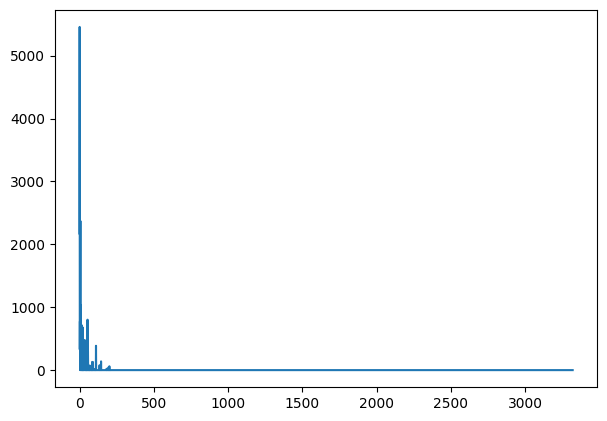

In [ ]:
plt.plot( cnt_in)

plt.savefig('./Maps/'+City_Name+'/hist_of_cnt_in_'+City_Name+'_'+str(epsilon* kms_per_radian)+'.png')

plt.plot()

[]

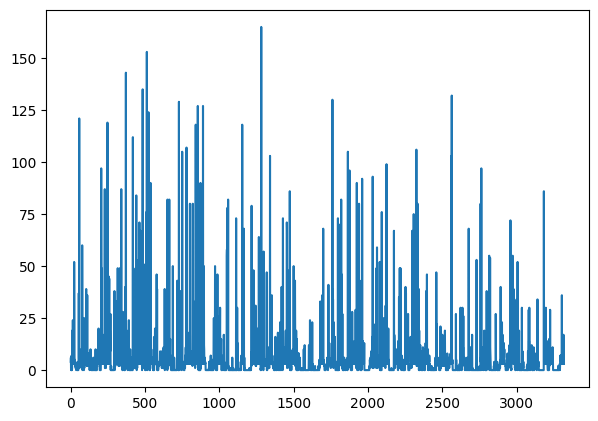

In [ ]:
plt.plot(cnt_out)
plt.savefig('./Maps/'+City_Name+'/hist_of_cnt_out_'+City_Name+'_'+str(epsilon* kms_per_radian)+'.png')
plt.plot()

Values less than or equal to 0 in data. Throwing out 0 or negative values


<AxesSubplot:>

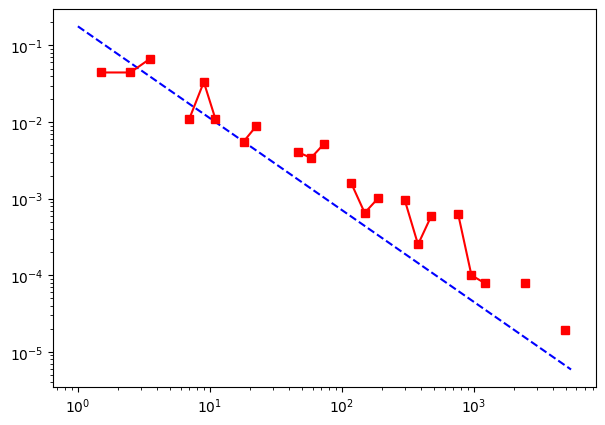

In [ ]:
fit = powerlaw.Fit(cnt_in,xmin=1,discrete=True)
fit.power_law.plot_pdf( color= 'b',linestyle='--',label='fit ccdf')
fit.plot_pdf(color='r',marker='s')

Values less than or equal to 0 in data. Throwing out 0 or negative values


<AxesSubplot:>

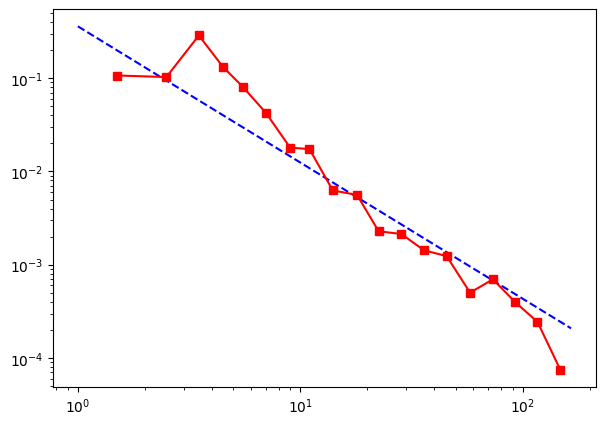

In [ ]:
fit = powerlaw.Fit(cnt_out,xmin=1,discrete=True)
fit.power_law.plot_pdf( color= 'b',linestyle='--',label='fit ccdf')
fit.plot_pdf(color='r',marker='s')

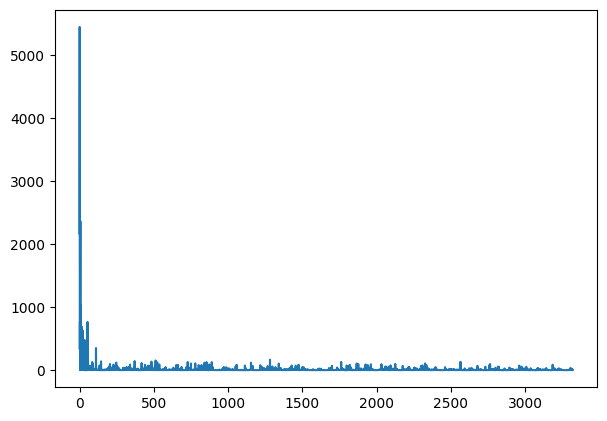

In [ ]:
plt.plot(abs(cnt_out-cnt_in))


In [ ]:
heat = abs(cnt_out-cnt_in)
print(heat.shape)


(3320,)


In [ ]:
heat

array([2.169e+03, 5.452e+03, 3.290e+02, ..., 3.000e+00, 6.000e+00,
       3.000e+00])

Calculating best minimal value for power law fit
alpha=  2.343759211852374   sigma=  0.031576371963751876


Values less than or equal to 0 in data. Throwing out 0 or negative values


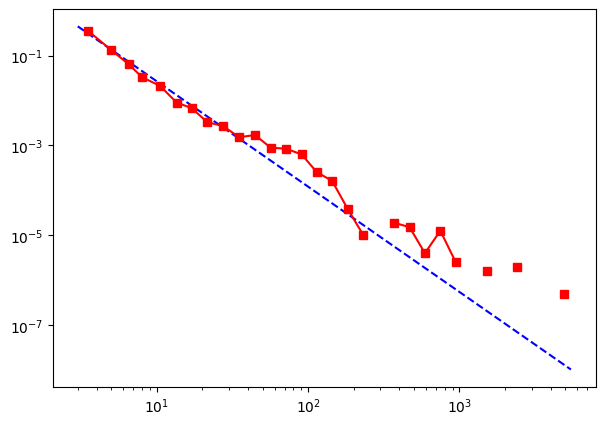

In [ ]:
import powerlaw
fit = powerlaw.Fit(heat)
fit.power_law.plot_pdf( color= 'b',linestyle='--',label='fit ccdf')
fit.plot_pdf(color='r',marker='s')

print('alpha= ',fit.power_law.alpha,'  sigma= ',fit.power_law.sigma)

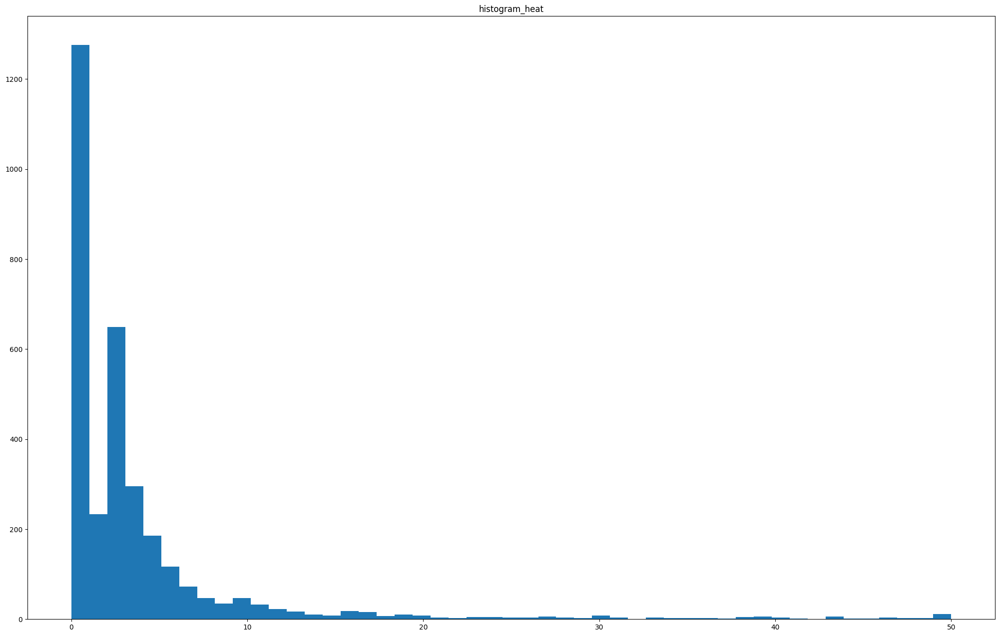

In [ ]:
plt.figure(figsize=(25,16))
plt.hist(heat, bins = np.linspace(0,50,50)) 
plt.title("histogram_heat") 
plt.savefig('./Maps/'+City_Name+'/hist_of_heat_'+City_Name+'_'+str(epsilon* kms_per_radian)+'.png')
plt.show()

In [ ]:
heat.mean()

11.883132530120482

In [ ]:
heat.std()

118.85787130396601

In [ ]:
np.max(heat)

5452.0

In [ ]:
m2 = folium.Map(location=[latitude, longitude],
               zoom_start=10, 
               width=1300, 
               height=1000
              )
m2

In [ ]:
resolution = (256/int(np.max(heat)))
print(resolution)

0.04695524578136464


In [ ]:
for j in range(0,num_clusters):
    temp = df_cluster.iloc[j]
    k = temp[0].shape
    for i in range(0,k[0]):
        y=df_cluster.iloc[j]
        t=y[0]
        s=t[i]
        colors2 = 'ff' + format(int(256-resolution*heat[j]),'x') + format(int(256-resolution*heat[j]),'x')
        if heat[j]==np.max(heat):
            colors2 = 'ff0000'
        if heat[j]<25:
            continue
        folium.CircleMarker([s[0], s[1]],
            radius=5,
            weight=15,
            color = '#'+colors2,
        
            ).add_to(m2)
    
m2

In [ ]:
m2.save('./Maps/'+City_Name+'/DBSCAN_Heat_'+str(City_Name)+'_'+str(epsilon* kms_per_radian)+'.html')


# For_Records

> 0.1
>> 15.99698568198945 163.24597597536595 5342.0 2654 18.163526752072343 9 17


> 0.09
>>14.59 140.33443715974056 4801.0 3400 14.178235294117647 9 17

> 0.08
>> 14.11131221719457 102.09365901661208 3107.0 4420 10.90633484162896 9 17

> 0.07
>>11.990935034413296 71.28808823597211 2254.0 5957 9 17

> 0.06
>>9.726334121159349 62.29935868595677 2142.0 8039 9 17


>0.01
>> 2.835379061371841 24.619431385627475 1162.0 33240 9 17



In [ ]:
print(heat.mean(),heat.std(),np.max(heat),num_clusters,query_month ,query_day )

11.883132530120482 118.85787130396601 5452.0 3321 2 10
